# Required

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import pandas as pd
import zipfile
import numpy as np
from torchvision import transforms
from torchvision.transforms import functional as F
from PIL import Image
import shutil
from sklearn.model_selection import train_test_split

import torch.optim as optim
from torch.optim import SGD
from tqdm import tqdm
import torchvision.transforms as T

import torchvision
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import CocoDetection
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.ops import box_iou

In [3]:
# Set paths for dataset
data_dir = '/content/drive/MyDrive/ColabNotebooks/'  # Change this path to where you stored the dataset
train_zip = os.path.join(data_dir, 'TrainIJCNN2013.zip')
test_zip = os.path.join(data_dir, 'TestIJCNN2013.zip')
annotations_file = '/content/drive/MyDrive/ColabNotebooks/gt.txt'

In [4]:
# -*- coding: utf-8 -*-
"""GTSDB_Faster_RCNN.ipynb"""

# Import necessary libraries
import os
import zipfile
import torch
import torchvision.transforms as T
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


# Extract the dataset
train_dir = '/content/train/TrainIJCNN2013'
test_dir = '/content/test/TestIJCNN2013Download'

os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

with zipfile.ZipFile(train_zip, 'r') as zip_ref:
    zip_ref.extractall('/content')
with zipfile.ZipFile(test_zip, 'r') as zip_ref:
    zip_ref.extractall('/content')

print("Dataset extracted successfully.")
train_dir = '/content/train/TrainIJCNN2013/TrainIJCNN2013'
test_dir = '/content/test/TestIJCNN2013Download/TestIJCNN2013Download'


Dataset extracted successfully.


In [5]:
import shutil

train_dir = 'TrainIJCNN2013'
test_dir = 'TestIJCNN2013Download'
shutil.copy(annotations_file, train_dir)
annotations_file = "/content/TrainIJCNN2013/gt.txt"

In [6]:
# # Λίστα για αποθήκευση διαστάσεων
# image_dimensions = []

# # Διαπέραση όλων των αρχείων στον φάκελο
# for filename in os.listdir(train_dir):
#     if filename.endswith(".ppm"):  # Έλεγχος για αρχεία .ppm
#         file_path = os.path.join(train_dir, filename)
#         with Image.open(file_path) as img:
#             width, height = img.size  # Απόκτηση πλάτους και ύψους
#             image_dimensions.append((filename, width, height))
#             print(f"Image: {filename}, Width: {width}, Height: {height}")

# # Ανάλυση των αποτελεσμάτων
# print(f"\nTotal images: {len(image_dimensions)}")
# print(f"Example dimensions: {image_dimensions[:5]}")

In [7]:
import torch
import os

def parse_annotations(annotations_file, image_dir):
    annotations = []

    # Φόρτωση των annotations
    with open(annotations_file, "r") as f:
        for line_no, line in enumerate(f.readlines()):
            if line_no == 0:  # Παράλειψη της γραμμής επικεφαλίδας
                continue
            fields = line.strip().split(",")
            if len(fields) != 6:  # Αναμενόμενες στήλες: filename, x1, y1, x2, y2, class
                print(f"Skipping malformed line {line_no + 1}: {line.strip()}")
                continue
            filename, x1, y1, x2, y2, class_id = fields
            x1, y1, x2, y2 = float(x1), float(y1), float(x2), float(y2)
            class_id = int(class_id)
            # Έλεγχος για bounding boxes εκτός ορίων εικόνας
            if x1 < 0 or y1 < 0 or x2 > 2048 or y2 > 2048:
                print(f"Skipping bounding box out of bounds: {filename}, [{x1}, {y1}, {x2}, {y2}]")
                continue
            # Έλεγχος για μη έγκυρα bounding boxes
            if x1 >= x2 or y1 >= y2:
                print(f"Skipping invalid bounding box at line {line_no + 1}: [{x1}, {y1}, {x2}, {y2}]")
                continue
            # Έλεγχος για πολύ μικρά bounding boxes
            if abs(x2 - x1) < 10 or abs(y2 - y1) < 10:
                print(f"Skipping small bounding box at line {line_no + 1}: [{x1}, {y1}, {x2}, {y2}]")
                continue
            # Προσθήκη στα annotations
            annotations.append({
                "filename": filename,
                "bbox": [x1, y1, x2, y2],
                "label": class_id
            })

    return annotations
    return annotations


# Example usage
annotations = parse_annotations(annotations_file, train_dir)

# Check the first few annotations to verify the format
print(annotations[:5])
annotations = parse_annotations(annotations_file, train_dir)
print(f"Parsed Annotations: {annotations[:5]}")  # Εμφάνιση των πρώτων 5 γραμμών
print(f"Total annotations: {len(annotations)}")

[{'filename': '/content/TrainIJCNN2013/00000.ppm', 'bbox': [774.0, 411.0, 815.0, 446.0], 'label': 11}, {'filename': '/content/TrainIJCNN2013/00001.ppm', 'bbox': [983.0, 388.0, 1024.0, 432.0], 'label': 40}, {'filename': '/content/TrainIJCNN2013/00001.ppm', 'bbox': [386.0, 494.0, 442.0, 552.0], 'label': 38}, {'filename': '/content/TrainIJCNN2013/00001.ppm', 'bbox': [973.0, 335.0, 1031.0, 390.0], 'label': 13}, {'filename': '/content/TrainIJCNN2013/00002.ppm', 'bbox': [892.0, 476.0, 1006.0, 592.0], 'label': 39}]
Parsed Annotations: [{'filename': '/content/TrainIJCNN2013/00000.ppm', 'bbox': [774.0, 411.0, 815.0, 446.0], 'label': 11}, {'filename': '/content/TrainIJCNN2013/00001.ppm', 'bbox': [983.0, 388.0, 1024.0, 432.0], 'label': 40}, {'filename': '/content/TrainIJCNN2013/00001.ppm', 'bbox': [386.0, 494.0, 442.0, 552.0], 'label': 38}, {'filename': '/content/TrainIJCNN2013/00001.ppm', 'bbox': [973.0, 335.0, 1031.0, 390.0], 'label': 13}, {'filename': '/content/TrainIJCNN2013/00002.ppm', 'bbox

In [8]:
# Define the dataset class for GTSDB
class GTSDBDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, annotations_file, transforms=None):
        self.image_dir = image_dir
        self.transforms = transforms
        self.annotations = parse_annotations(annotations_file, image_dir)

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        annotation = self.annotations[idx]
        img_path = os.path.join(self.image_dir, annotation["filename"])
        img = Image.open(img_path).convert("RGB")

        # Convert bounding boxes and labels to tensors
        bbox = torch.tensor([annotation["bbox"]], dtype=torch.float32)  # (num_boxes, 4)
        label = torch.tensor([annotation["label"]], dtype=torch.int64)  # (num_boxes,)

        target = {"boxes": bbox, "labels": label}

        # Apply transformations if any
        if self.transforms:
            img = self.transforms(img)

        return img, target

# Faster-RCNN

In [9]:
# Define transforms for the dataset
transforms = T.Compose([
    T.ToTensor(),  # Convert image to tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Imagenet normalization
])

# Load the dataset
train_dataset = GTSDBDataset(train_dir, annotations_file, transforms=transforms)
test_dataset = GTSDBDataset(test_dir, annotations_file, transforms=transforms)

# Create data loaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=8, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [10]:
# Define Faster R-CNN model
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision

def get_faster_rcnn_model(num_classes):
    """
    Load Faster R-CNN with a ResNet50 backbone and modify it for GTSDB.
    """
    # Load pre-trained Faster R-CNN
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # Replace the classifier with one for our dataset
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

# Initialize the model
num_classes = 44  # 43 traffic sign classes + 1 background
model = get_faster_rcnn_model(num_classes)

# Move model to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 196MB/s]


In [11]:
import os
import torch
from tqdm import tqdm

checkpoint_path = '/content/drive/MyDrive/ColabNotebooks/checkpoint.pth'
best_model_path = '/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth'

def train_model(model, train_loader, device, optimizer, num_epochs=15, checkpoint_dir='checkpoints'):
    model.train()
    best_loss = float('inf')
    best_epoch = 0

    # Δημιουργία του directory αν δεν υπάρχει
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    # **1. Φόρτωση του υπάρχοντος καλύτερου μοντέλου (αν υπάρχει)**
    if os.path.exists(best_model_path):
        checkpoint = torch.load(best_model_path, map_location=device)

        if "model_state_dict" in checkpoint:
            # Αν είναι πλήρες checkpoint
            model.load_state_dict(checkpoint["model_state_dict"])
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            best_loss = checkpoint.get("best_loss", float('inf'))
            best_epoch = checkpoint.get("epoch", 0)
            print(f"Loaded existing best model with loss: {best_loss:.4f} from epoch {best_epoch}")
        else:
            # Αν είναι μόνο state_dict (δηλαδή χωρίς optimizer και epoch info)
            model.load_state_dict(checkpoint)
            print("Loaded existing model weights, but optimizer and epoch info were not found.")

    # **2. Εκπαίδευση**
    for epoch in range(num_epochs):
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")  # Γραμμή προόδου
        total_loss = 0

        for images, targets in pbar:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            optimizer.zero_grad()
            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())  # Συνολικό loss
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            pbar.set_postfix(loss=loss.item())

        # Υπολογισμός μέσου loss
        avg_loss = total_loss / len(train_loader)
        print(f"Epoch {epoch + 1}, Average Loss: {avg_loss:.4f}")

        # **3. Αντικατάσταση του καλύτερου μοντέλου αν βελτιωθεί**
        if avg_loss < best_loss:
            best_loss = avg_loss
            best_epoch = epoch + 1
            model_save_path = os.path.join(checkpoint_dir, f"model_epoch_{best_epoch}_loss_{avg_loss:.4f}.pth")
            torch.save(model.state_dict(), model_save_path)
            print(f"New best model saved at epoch {best_epoch} with avg_loss {best_loss:.4f}")

            # Ενημέρωση του global best_model
            torch.save({
                'epoch': best_epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_loss': best_loss
            }, best_model_path)
            print(f"Best model updated and saved to {best_model_path}")

    # **4. Τελική αποθήκευση του checkpoint στο Google Drive**
    torch.save({
        'epoch': best_epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_loss': best_loss
    }, checkpoint_path)
    print(f"Final checkpoint saved to {checkpoint_path}")

In [31]:
torch.cuda.empty_cache()
train_model(model, train_loader, device, optimizer, num_epochs=15, checkpoint_dir='checkpoints')

<ipython-input-11-6536a7cd8402>:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path, map_location=device)


Loaded existing best model with loss: 0.0555 from epoch 15


Epoch 1/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.0443]


Epoch 1, Average Loss: 0.0540
New best model saved at epoch 1 with avg_loss 0.0540
Best model updated and saved to /content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth


Epoch 2/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.041]


Epoch 2, Average Loss: 0.0546


Epoch 3/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.0673]


Epoch 3, Average Loss: 0.0539
New best model saved at epoch 3 with avg_loss 0.0539
Best model updated and saved to /content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth


Epoch 4/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0598]


Epoch 4, Average Loss: 0.0539
New best model saved at epoch 4 with avg_loss 0.0539
Best model updated and saved to /content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth


Epoch 5/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0485]


Epoch 5, Average Loss: 0.0542


Epoch 6/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.0537]


Epoch 6, Average Loss: 0.0540


Epoch 7/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.0575]


Epoch 7, Average Loss: 0.0537
New best model saved at epoch 7 with avg_loss 0.0537
Best model updated and saved to /content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth


Epoch 8/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0611]


Epoch 8, Average Loss: 0.0543


Epoch 9/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0635]


Epoch 9, Average Loss: 0.0546


Epoch 10/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0577]


Epoch 10, Average Loss: 0.0536
New best model saved at epoch 10 with avg_loss 0.0536
Best model updated and saved to /content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth


Epoch 11/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0641]


Epoch 11, Average Loss: 0.0539


Epoch 12/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.0484]


Epoch 12, Average Loss: 0.0539


Epoch 13/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0436]


Epoch 13, Average Loss: 0.0538


Epoch 14/15: 100%|██████████| 107/107 [02:02<00:00,  1.15s/it, loss=0.0537]


Epoch 14, Average Loss: 0.0541


Epoch 15/15: 100%|██████████| 107/107 [02:02<00:00,  1.14s/it, loss=0.0517]


Epoch 15, Average Loss: 0.0541
Final checkpoint saved to /content/drive/MyDrive/ColabNotebooks/checkpoint.pth


In [ ]:
import shutil
import os

# Ορισμός του φακέλου που θέλουμε να αντιγράψουμε
checkpoint_path = '/content/checkpoints'
destination_dir = '/content/drive/MyDrive/ColabNotebooks/checkpoints_drive'

# Αν ο φάκελος προορισμού υπάρχει, διαγράψτε τον
if os.path.exists(destination_dir):
    shutil.rmtree(destination_dir)  # Διαγραφή του φακέλου

# Αντιγραφή ολόκληρου του φακέλου από το checkpoint_path στο destination_dir
shutil.copytree(checkpoint_path, destination_dir)

print(f"Folder copied from {checkpoint_path} to {destination_dir}")

Folder copied from /content/checkpoints to /content/drive/MyDrive/ColabNotebooks/checkpoints_drive


# Checkpoint

In [21]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# 1. Καθορισμός της συσκευής
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Αρχικοποίηση του μοντέλου
num_classes = 44  # 43 κατηγορίες + background
model = fasterrcnn_resnet50_fpn(pretrained=False)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# 3. Φόρτωση των weights
#model.load_state_dict(torch.load("/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth"))
checkpoint = torch.load("/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth", map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])

# 4. Μεταφορά του μοντέλου στη συσκευή
model.to(device)
model.eval()  # Set to evaluation mode

<ipython-input-21-5fd330fce1b4>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load("/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [39]:
import torch
import numpy as np
from torchvision.ops import box_iou
import torch.nn.functional as F
from torchvision import transforms

# Map class IDs to class names
CLASS_ID_TO_INT = {
    1: 'Speed limit (20km/h)', 2: 'Speed limit (30km/h)', 3: 'Speed limit (50km/h)',
    4: 'Speed limit (60km/h)', 5: 'Speed limit (70km/h)', 6: 'Speed limit (80km/h)',
    7: 'End of speed limit (80km/h)', 8: 'Speed limit (100km/h)', 9: 'Speed limit (120km/h)',
    10: 'No passing', 11: 'No passing veh over 3.5 tons', 12: 'Right-of-way at intersection',
    13: 'Priority road', 14: 'Yield', 15: 'Stop', 16: 'No vehicles',
    17: 'Veh > 3.5 tons prohibited', 18: 'No entry', 19: 'General caution',
    20: 'Dangerous curve left', 21: 'Dangerous curve right', 22: 'Double curve',
    23: 'Bumpy road', 24: 'Slippery road', 25: 'Road narrows on the right',
    26: 'Road work', 27: 'Traffic signals', 28: 'Pedestrians', 29: 'Children crossing',
    30: 'Bicycles crossing', 31: 'Beware of ice/snow', 32: 'Wild animals crossing',
    33: 'End speed + passing limits', 34: 'Turn right ahead', 35: 'Turn left ahead',
    36: 'Ahead only', 37: 'Go straight or right', 38: 'Go straight or left',
    39: 'Keep right', 40: 'Keep left', 41: 'Roundabout mandatory',
    42: 'End of no passing', 43: 'End no passing veh > 3.5 tons'
}
CLASS_ID_TO_INT[0] = "Background"

# **Parameters for evaluation**
iou_threshold = 0.15  # Κατώφλι IoU
score_threshold = 0.1  # Κατώφλι ανίχνευσης

# **Metrics storage**
precisions, recalls = [], []

# **5 Inference & mAP Calculation**
with torch.no_grad():
    for images, targets in test_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        predictions = model(images)

        for img_idx, prediction in enumerate(predictions):
            print(f"\n🔹 Εικόνα {img_idx}:")

            pred_boxes = prediction["boxes"]
            pred_scores = prediction["scores"]
            detected_labels = prediction["labels"]

            gt_boxes = targets[img_idx]["boxes"]

            if len(gt_boxes) == 0 or len(pred_boxes) == 0:
                print("⚠️ Warning: No ground truth or predictions.")
                continue

            # Υπολογισμός IoU
            ious = box_iou(pred_boxes, gt_boxes)
            max_iou, _ = ious.max(dim=1)

            # Κρατάμε μόνο detections με IoU > threshold
            valid_detections = max_iou > iou_threshold
            tp = valid_detections.sum().item()
            fp = len(pred_boxes) - tp
            fn = max(len(gt_boxes) - tp, 1)

            precision = tp / max(tp + fp, 1e-6)
            recall = tp / (tp + fn)

            precisions.append(precision)
            recalls.append(recall)

            for i in range(len(pred_boxes)):
                if pred_scores[i] > score_threshold:
                    x_min, y_min, x_max, y_max = map(int, pred_boxes[i].tolist())

                    # Αντιστοίχιση σε κείμενο
                    class_id = detected_labels[i].item()
                    class_name = CLASS_ID_TO_INT.get(class_id, "Unknown")

                    print(f"   - Object {i}:")
                    print(f"   - Bounding Box: {pred_boxes[i]}")
                    print(f"   - Faster R-CNN Score: {pred_scores[i]:.2f}")
                    print(f"   - Class: {class_name}")

# **Υπολογισμός mAP**
mean_precision = np.mean(precisions) if precisions else 0
mean_recall = np.mean(recalls) if recalls else 0
map_score = mean_precision * mean_recall  # Κανονικοποίηση

print(f"\n Precision: {mean_precision:.4f}, Recall: {mean_recall:.4f}, mAP: {map_score:.4f}")

Streaming output truncated to the last 5000 lines.

🔹 Εικόνα 5:
   - Object 0:
   - Bounding Box: tensor([117.6705, 426.8186, 208.1774, 521.6498], device='cuda:0')
   - Faster R-CNN Score: 0.98
   - Class: Go straight or left

🔹 Εικόνα 6:
   - Object 0:
   - Bounding Box: tensor([909.7905, 326.0927, 955.5491, 370.4308], device='cuda:0')
   - Faster R-CNN Score: 0.89
   - Class: Speed limit (20km/h)
   - Object 1:
   - Bounding Box: tensor([915.2936, 386.6519, 958.4118, 434.7584], device='cuda:0')
   - Faster R-CNN Score: 0.89
   - Class: Speed limit (120km/h)

🔹 Εικόνα 7:
   - Object 0:
   - Bounding Box: tensor([909.7905, 326.0927, 955.5491, 370.4308], device='cuda:0')
   - Faster R-CNN Score: 0.89
   - Class: Speed limit (20km/h)
   - Object 1:
   - Bounding Box: tensor([915.2936, 386.6519, 958.4118, 434.7584], device='cuda:0')
   - Faster R-CNN Score: 0.89
   - Class: Speed limit (120km/h)

🔹 Εικόνα 0:
   - Object 0:
   - Bounding Box: tensor([1188.4062,  130.5479, 1292.3282,  249.2

# Visualize Predictions

In [37]:
import cv2
import matplotlib.pyplot as plt
import torchvision.transforms as T

def visualize_predictions(image_path, model, threshold):
    """
    Visualize predictions on a single image.

    Args:
    - image_path: Path to the input image.
    - model: Trained Faster R-CNN model.
    - threshold: Confidence threshold for displaying predictions.
    """
    # Load and preprocess the image
    img = Image.open(image_path).convert("RGB")
    transform = T.Compose([T.ToTensor()])
    img_tensor = transform(img).to(device)

    # Make predictions
    with torch.no_grad():
        prediction = model([img_tensor])

    # Extract boxes, labels, and scores
    pred_boxes = prediction[0]['boxes'].cpu().numpy()
    pred_scores = prediction[0]['scores'].cpu().numpy()
    pred_labels = prediction[0]['labels'].cpu().numpy()

    # Draw boxes on the original image
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    for box, score, label in zip(pred_boxes, pred_scores, pred_labels):
        if score >= threshold:
            x1, y1, x2, y2 = box.astype(int)
            class_name = CLASS_ID_TO_INT[label]

            # Draw rectangle and label
            cv2.rectangle(img_cv, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img_cv, f"{class_name}: {score:.2f}", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()


Visualizing predictions for: 00021.ppm


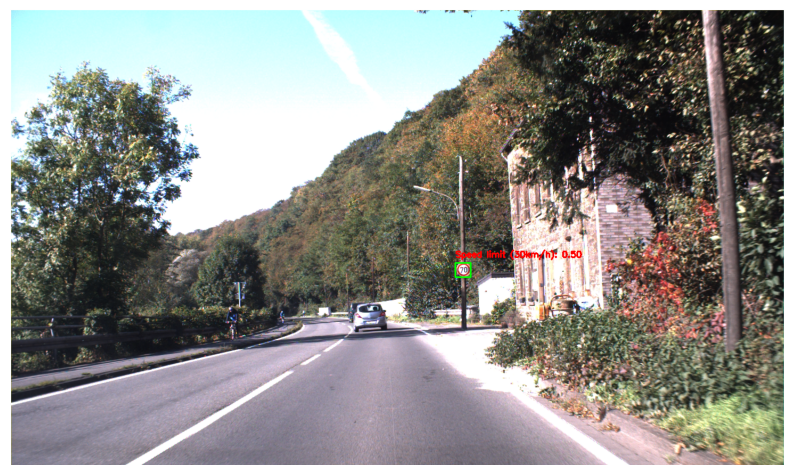

Visualizing predictions for: 00181.ppm


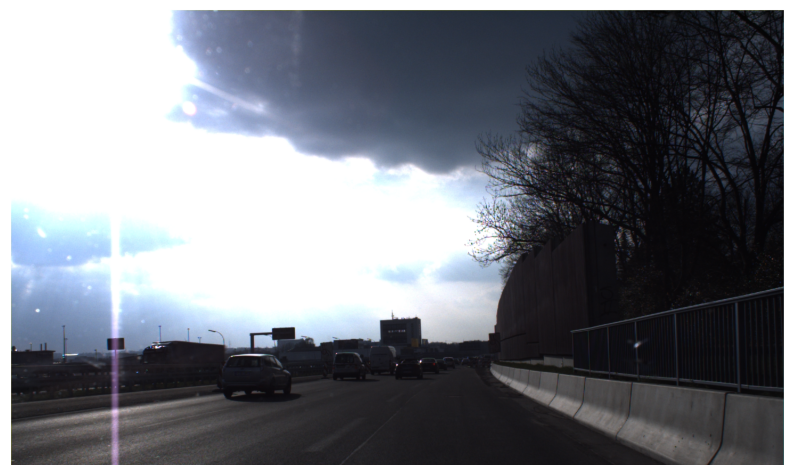

Visualizing predictions for: 00197.ppm


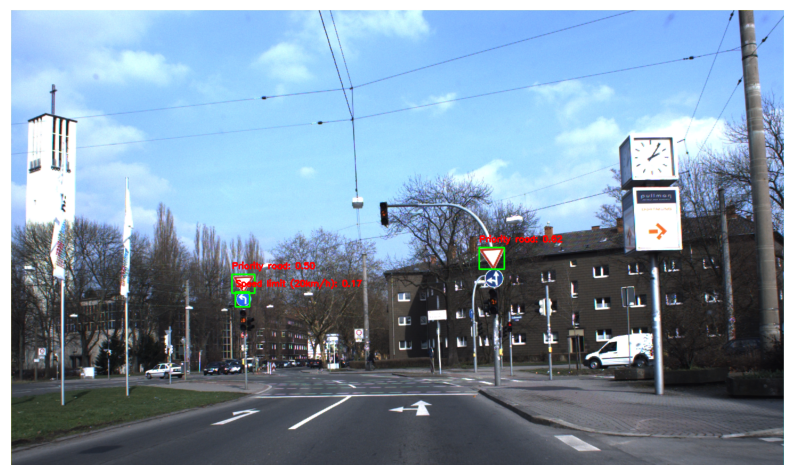

Visualizing predictions for: 00298.ppm


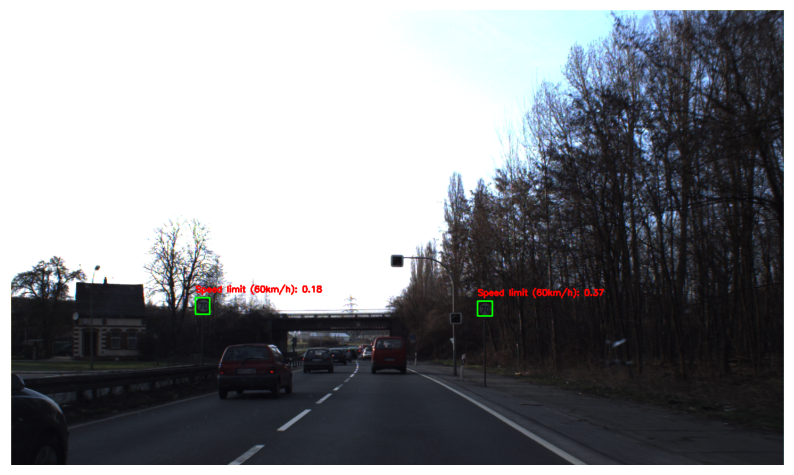

Visualizing predictions for: 00155.ppm


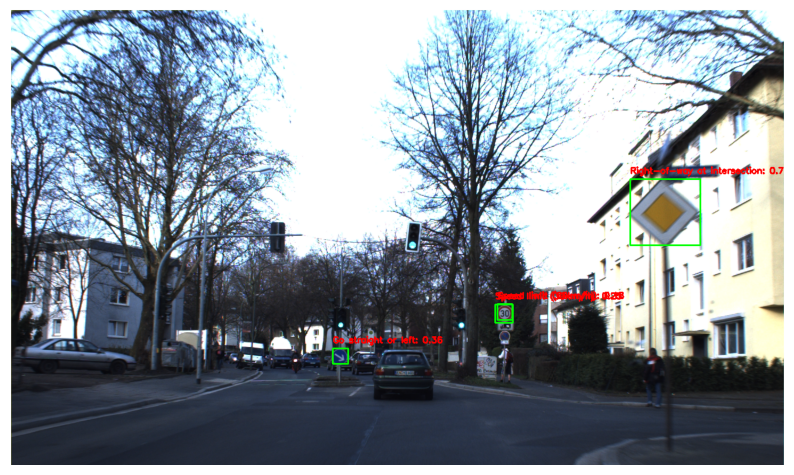

Visualizing predictions for: 00001.ppm


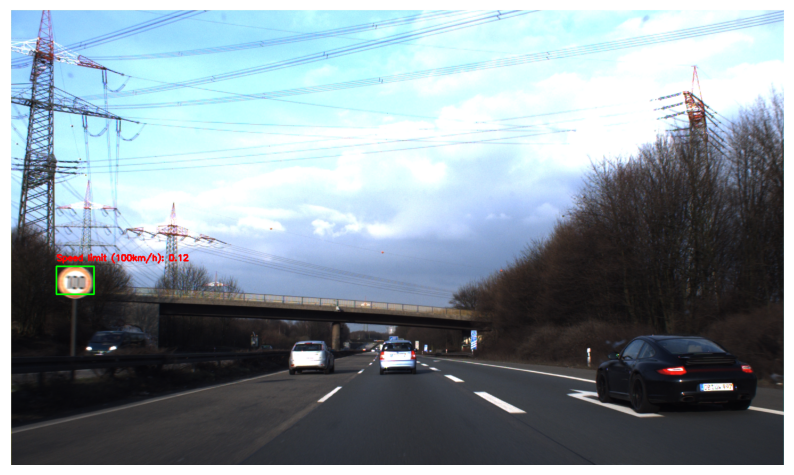

Visualizing predictions for: 00012.ppm


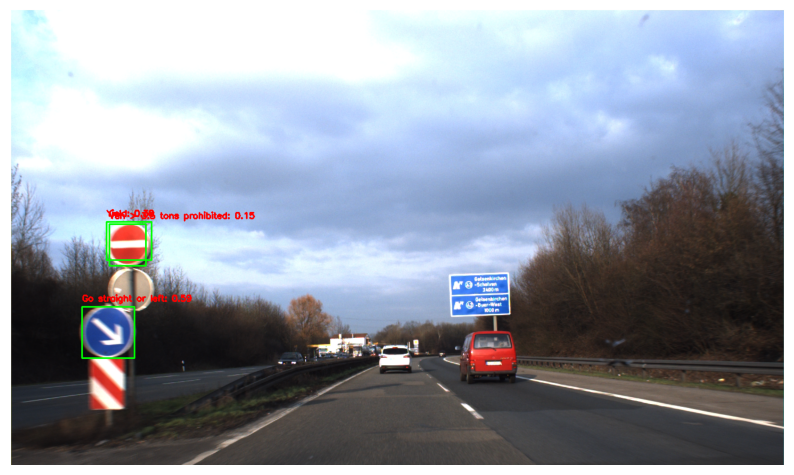

Visualizing predictions for: 00190.ppm


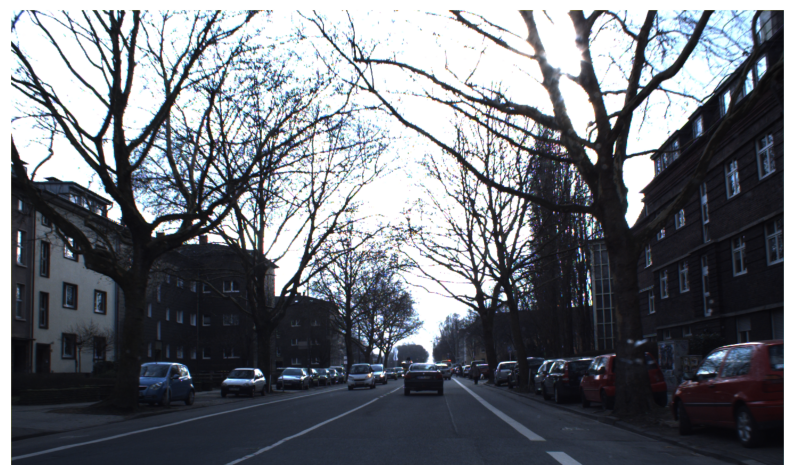

Visualizing predictions for: 00110.ppm


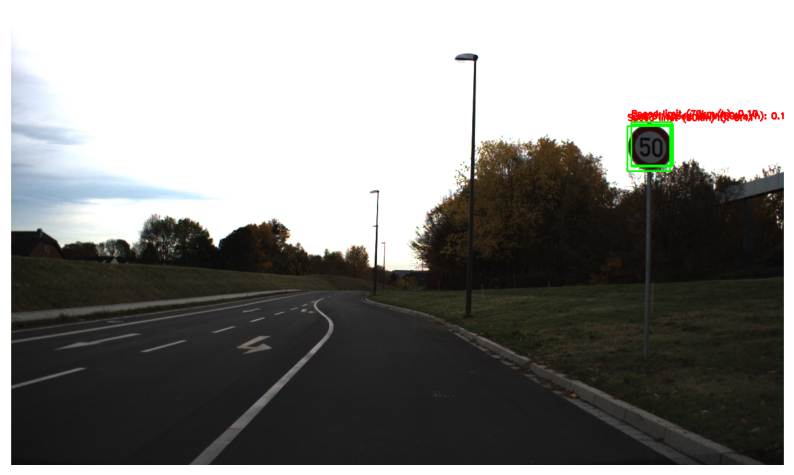

Visualizing predictions for: 00134.ppm


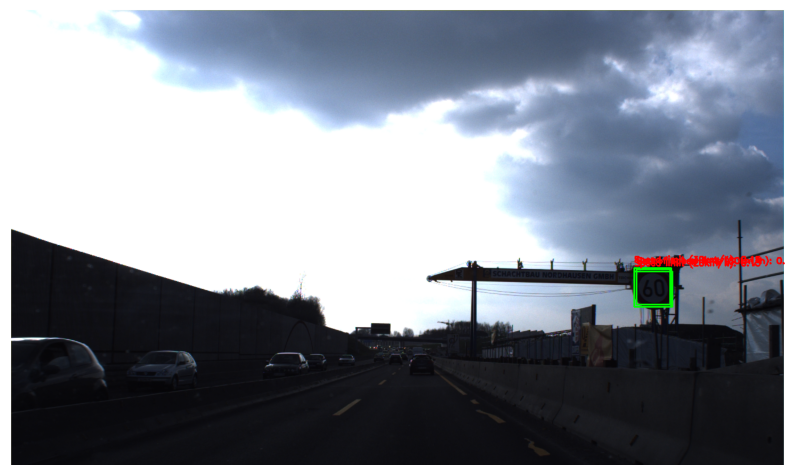

In [40]:
import os
import numpy as np
# Test images directory
test_images_dir = 'TestIJCNN2013Download'
os.makedirs(test_images_dir, exist_ok=True)

# List all test images
test_images = os.listdir(test_images_dir)

offset = 80
# Visualize predictions for a few images
for i in range(10):  # Visualize first 10 images
    image_path = os.path.join(test_images_dir, test_images[i+offset])
    print(f"Visualizing predictions for: {test_images[i+offset]}")
    visualize_predictions(image_path, model, score_threshold)

# Visualize Predictions (ResNet50)

In [18]:
import torch
import torchvision
import torch.nn.functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision import transforms
from PIL import Image

# 1. Καθορισμός της συσκευής
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Αρχικοποίηση του μοντέλου
num_classes = 44  # 43 κατηγορίες + background
model = fasterrcnn_resnet50_fpn(pretrained=False)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# 3. Φόρτωση των weights
#model.load_state_dict(torch.load("/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth"))
checkpoint = torch.load("/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model.pth", map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])

# 4. Μεταφορά του μοντέλου στη συσκευή
model.to(device)
model.eval()  # Set to evaluation mode

# 2️ **Φόρτωση του εκπαιδευμένου ResNet50 (για Classification)**
resnet50 = torchvision.models.resnet50(pretrained=False)
num_classes = 43  # Πλήθος κλάσεων πινακίδων
resnet50.fc = torch.nn.Linear(resnet50.fc.in_features, num_classes)

# Φόρτωση του εκπαιδευμένου ResNet50 μοντέλου
resnet50_path = "/content/drive/MyDrive/ColabNotebooks/resnet50_best.pth"
resnet50.load_state_dict(torch.load(resnet50_path, map_location=device))
resnet50.to(device)
resnet50.eval()

# 3️ **Προετοιμασία μετασχηματισμών για το ResNet50**
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet50 input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

<ipython-input-18-8e92cf8f0d27>:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load("/content/drive/MyDrive/ColabNotebooks/checkpoints_drive/best_model

In [20]:
import torch
import torch.nn.functional as F
from torchvision.ops import box_iou
from torchvision import transforms
import numpy as np

# Map class IDs to class names
CLASS_ID_TO_INT = {
    1: ' Speed limit (20km/h)' ,
    2: ' Speed limit (30km/h)' ,
    3: ' Speed limit (50km/h)' ,
    4: ' Speed limit (60km/h)' ,
    5: ' Speed limit (70km/h)' ,
    6: ' Speed limit (80km/h)' ,
    7: ' End of speed limit (80km/h)' ,
    8: ' Speed limit (100km/h)' ,
    9: ' Speed limit (120km/h)' ,
    10: ' No passing' ,
    11:' No passing veh over 3.5 tons' ,
    12:' Right-of-way at intersection' ,
    13:' Priority road' ,
    14:' Yield' ,
    15:' Stop' ,
    16:' No vehicles' ,
    17:' Veh > 3.5 tons prohibited' ,
    18:' No entry' ,
    19:' General caution' ,
    20:' Dangerous curve left' ,
    21:' Dangerous curve right' ,
    22:' Double curve' ,
    23:' Bumpy road' ,
    24:' Slippery road' ,
    25:' Road narrows on the right' ,
    26:' Road work' ,
    27:' Traffic signals' ,
    28:' Pedestrians' ,
    29:' Children crossing' ,
    30:' Bicycles crossing' ,
    31:' Beware of ice/snow' ,
    32:' Wild animals crossing' ,
    33:' End speed + passing limits' ,
    34:' Turn right ahead' ,
    35:' Turn left ahead' ,
    36:' Ahead only' ,
    37:' Go straight or right' ,
    38:' Go straight or left' ,
    39:' Keep right' ,
    40:' Keep left' ,
    41:' Roundabout mandatory' ,
    42:' End of no passing' ,
    43:' End no passing veh > 3.5 tons'
}
CLASS_ID_TO_INT[0] = 0  # Το background

threshold = 0.2  # Κατώφλι για object detection
iou_threshold = 0.7  # Κατώφλι IoU για True Positives

precisions, recalls = [], []

# 4️ **Inference Loop με υπολογισμό mAP**
with torch.no_grad():
    for images, targets in test_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # **1. Εκτέλεση του Faster R-CNN για Object Detection**
        detections = model(images)

        for img_idx, prediction in enumerate(detections):
            print(f"\n🔹 Εικόνα {img_idx}:")

            # 🔹 **Εξαγωγή κουτιών, βαθμολογιών και labels**
            pred_boxes = prediction["boxes"]
            pred_scores = prediction["scores"]
            detected_labels = prediction["labels"]

            gt_boxes = targets[img_idx]["boxes"]  # Πραγματικά κουτιά

            if len(gt_boxes) == 0:
                print(f"⚠ No ground truth boxes for image {img_idx}")
                continue

            if len(pred_boxes) == 0:
                print(f"⚠ No predicted boxes for image {img_idx}")
                continue

            # 🏷 **1. Υπολογισμός IoU**
            ious = box_iou(pred_boxes, gt_boxes)
            max_iou, _ = ious.max(dim=1)

            # **2. Μετράμε τα True Positives & False Positives**
            valid_detections = max_iou > iou_threshold
            tp = valid_detections.sum().item()
            fp = len(pred_boxes) - tp
            fn = max(len(gt_boxes) - tp, 1)  # False negatives

            # **3. Υπολογισμός Precision & Recall**
            precision = tp / max(tp + fp, 1e-6)
            recall = tp / (tp + fn)

            precisions.append(precision)
            recalls.append(recall)

            print(f"TP={tp}, FP={fp}, FN={fn}, Precision={precision:.4f}, Recall={recall:.4f}")

            # **4. Εξαγωγή και Ταξινόμηση των αντικειμένων με ResNet50**
            for i in range(len(pred_boxes)):
                if pred_scores[i] > threshold:  # Threshold για ανίχνευση
                    x_min, y_min, x_max, y_max = map(int, pred_boxes[i].tolist())

                    # 🖼️ **Crop object από την εικόνα**
                    cropped_obj = images[img_idx][:, y_min:y_max, x_min:x_max]
                    cropped_img = transforms.ToPILImage()(cropped_obj.cpu())  # Μετατροπή σε PIL

                    # **ResNet50 Classification**
                    input_img = transform(cropped_img).unsqueeze(0).to(device)  # Προετοιμασία για το ResNet50
                    class_logits = resnet50(input_img)
                    class_probs = F.softmax(class_logits, dim=1)
                    predicted_class = torch.argmax(class_probs, dim=1).item()
                    predicted_class_name = CLASS_ID_TO_INT.get(predicted_class, "Unknown")

                    print(f"   - Object {i}:")
                    print(f"   - Bounding Box: {pred_boxes[i]}")
                    print(f"   - Faster R-CNN Score: {pred_scores[i]:.2f}")
                    print(f"   - ResNet50 Predicted Class: {predicted_class_name} ({predicted_class})")

# **Τελικός Υπολογισμός του mAP**
mean_precision = np.mean(precisions)
mean_recall = np.mean(recalls)
map_score = mean_precision * mean_recall  # Κανονικοποίηση

print(f"\n Precision: {mean_precision:.4f}, Recall: {mean_recall:.4f}, mAP: {map_score:.4f}")

Streaming output truncated to the last 5000 lines.
🔹 Εικόνα 7:
📊 TP=1, FP=1, FN=1, Precision=0.5000, Recall=0.5000
   📍 Object 0:
   - Bounding Box: tensor([1225.3674,  313.6912, 1298.0992,  385.5485], device='cuda:0')
   - Faster R-CNN Score: 0.91
   - ResNet50 Predicted Class:  General caution (19)
   📍 Object 1:
   - Bounding Box: tensor([311.2955, 395.9695, 377.1441, 462.5246], device='cuda:0')
   - Faster R-CNN Score: 0.90
   - ResNet50 Predicted Class:  General caution (19)

🔹 Εικόνα 0:
📊 TP=1, FP=1, FN=1, Precision=0.5000, Recall=0.5000
   📍 Object 0:
   - Bounding Box: tensor([1225.3674,  313.6912, 1298.0992,  385.5485], device='cuda:0')
   - Faster R-CNN Score: 0.91
   - ResNet50 Predicted Class:  General caution (19)
   📍 Object 1:
   - Bounding Box: tensor([311.2955, 395.9695, 377.1441, 462.5246], device='cuda:0')
   - Faster R-CNN Score: 0.90
   - ResNet50 Predicted Class:  General caution (19)

🔹 Εικόνα 1:
📊 TP=2, FP=1, FN=1, Precision=0.6667, Recall=0.6667
   📍 Object 0:


In [15]:
import cv2
import matplotlib.pyplot as plt
import torchvision.transforms as T

def visualize_predictions(image_path, model, threshold=0.1):
    """
    Visualize predictions on a single image.

    Args:
    - image_path: Path to the input image.
    - model: Trained Faster R-CNN model.
    - threshold: Confidence threshold for displaying predictions.
    """
    # Load and preprocess the image
    img = Image.open(image_path).convert("RGB")
    transform = T.Compose([T.ToTensor()])
    img_tensor = transform(img).to(device)

    # Make predictions
    with torch.no_grad():
        prediction = model([img_tensor])

    # Extract boxes, labels, and scores
    pred_boxes = prediction[0]['boxes'].cpu().numpy()
    pred_scores = prediction[0]['scores'].cpu().numpy()
    pred_labels = prediction[0]['labels'].cpu().numpy()

    # Draw boxes on the original image
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    for box, score, label in zip(pred_boxes, pred_scores, pred_labels):
        if score >= threshold:
            x1, y1, x2, y2 = box.astype(int)
            class_name = CLASS_ID_TO_INT[label]

            # Draw rectangle and label
            cv2.rectangle(img_cv, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img_cv, f"{class_name}: {score:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

Visualizing predictions for: 00137.ppm


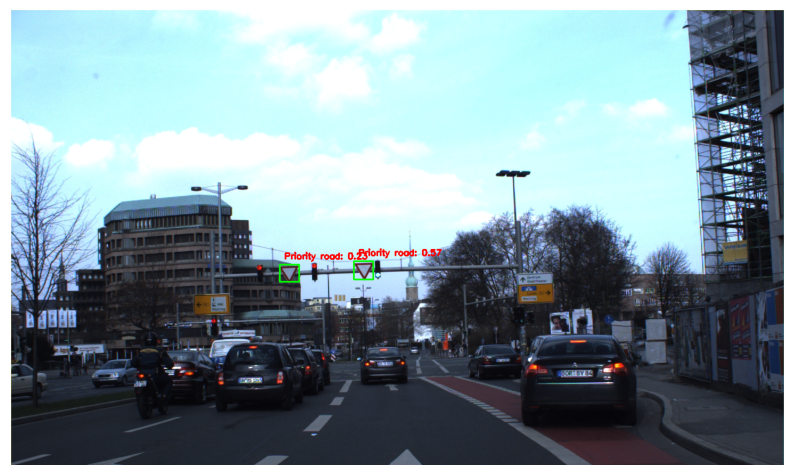

Visualizing predictions for: 00172.ppm


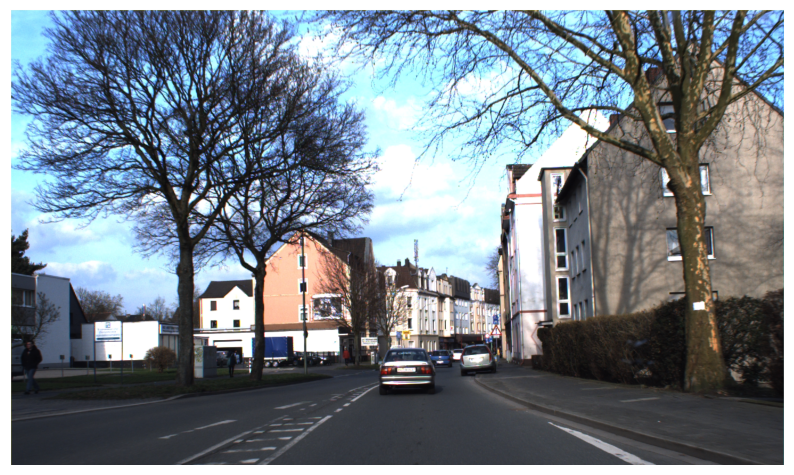

Visualizing predictions for: 00188.ppm


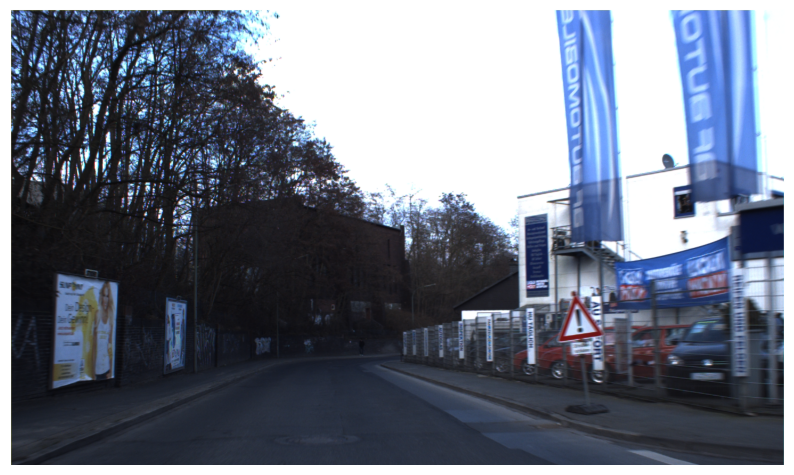

Visualizing predictions for: 00067.ppm


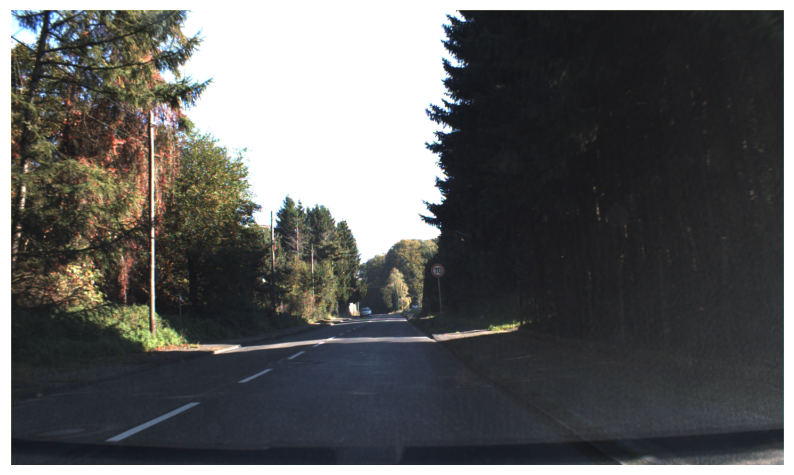

Visualizing predictions for: 00071.ppm


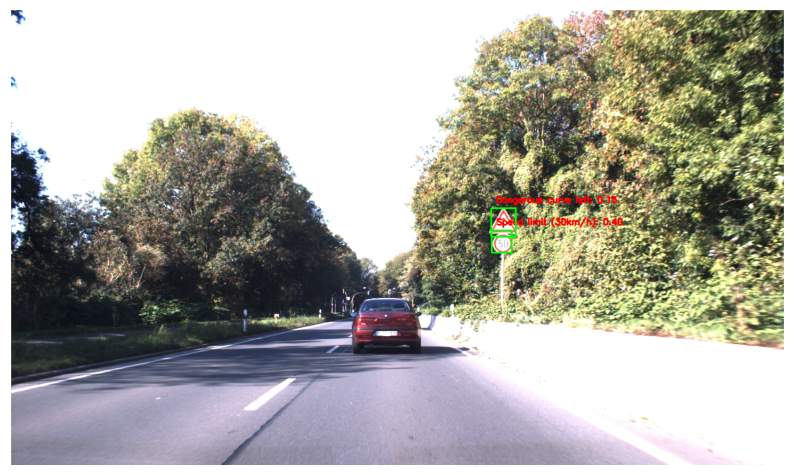

Visualizing predictions for: 00161.ppm


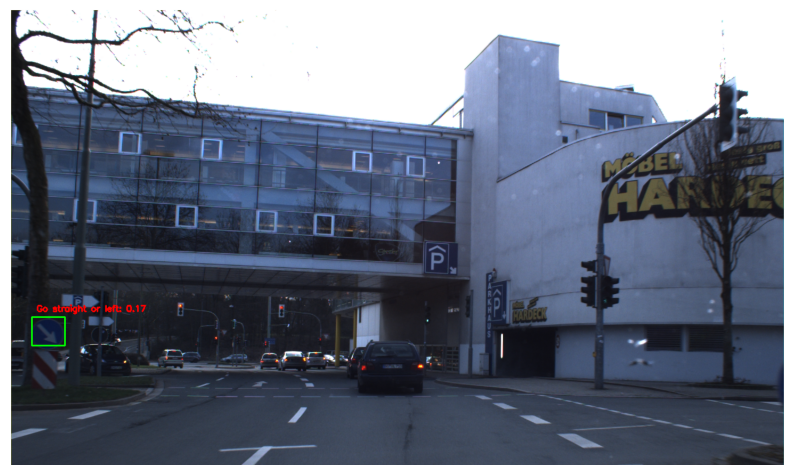

Visualizing predictions for: 00225.ppm


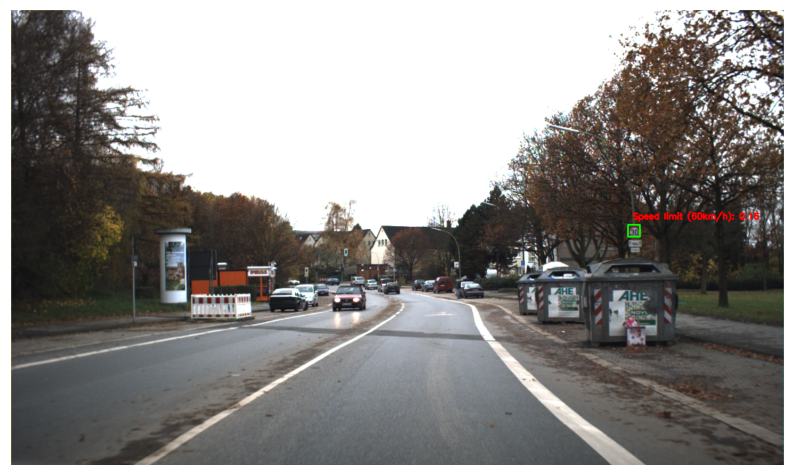

Visualizing predictions for: 00156.ppm


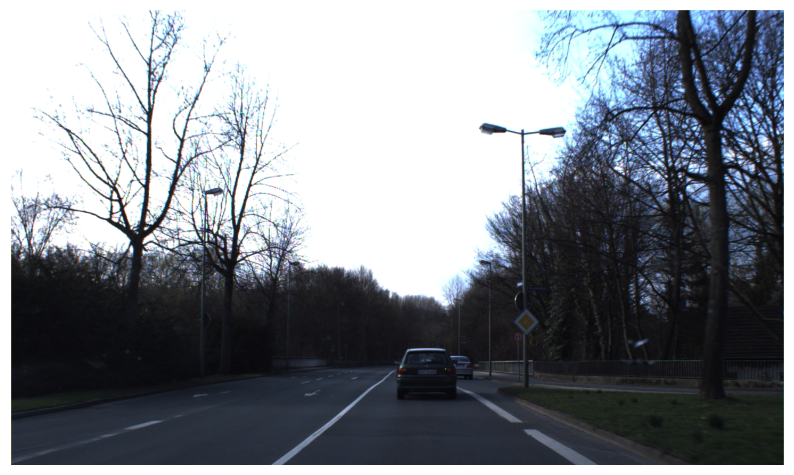

Visualizing predictions for: 00006.ppm


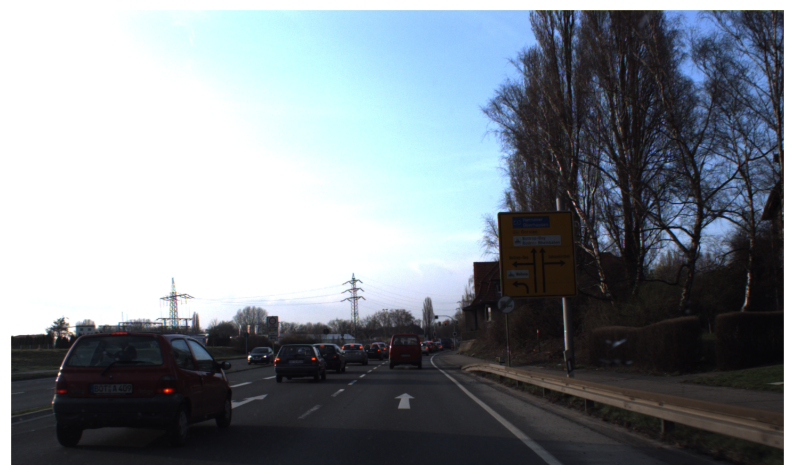

Visualizing predictions for: 00085.ppm


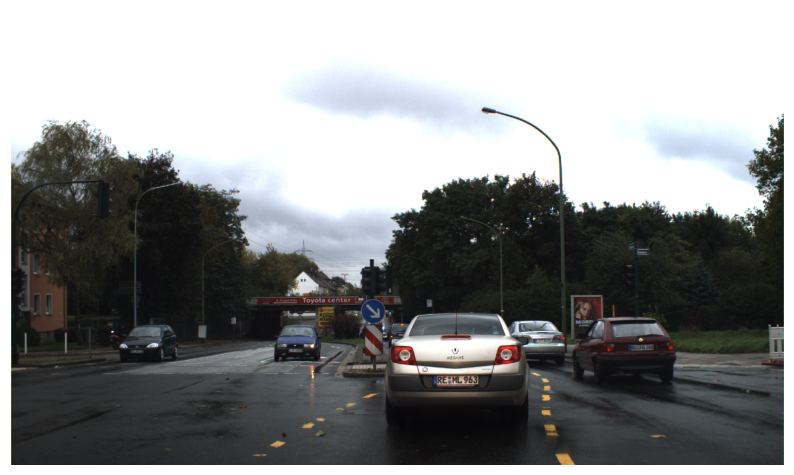

In [16]:
import os
import numpy as np
# Test images directory
test_images_dir = 'TestIJCNN2013Download'
os.makedirs(test_images_dir, exist_ok=True)

# List all test images
test_images = os.listdir(test_images_dir)

offset = 10
# Visualize predictions for a few images
for i in range(10):  # Visualize first 10 images
    image_path = os.path.join(test_images_dir, test_images[i+offset])
    print(f"Visualizing predictions for: {test_images[i+offset]}")
    visualize_predictions(image_path, model, threshold=0.15)

# Anchors

In [ ]:
# Feature Map's Shape
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

anchor_generator = AnchorGenerator(
    sizes=((16, 32, 64, 128, 256),),  # Adjust these sizes based on object sizes in your dataset
    aspect_ratios=((0.5, 1.0, 2.0),)  # Default aspect ratios
)
# 4. Φόρτωση και μετατροπή της εικόνας
image_path = "/content/TrainIJCNN2013/00/00000.ppm"
image = Image.open(image_path).convert("RGB")

image_tensor = transforms(image).unsqueeze(0).to(device)  # Προσθήκη batch dimension

# Φόρτωσε το μοντέλο Faster R-CNN
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.rpn.anchor_generator = anchor_generator  # Προσαρμοσμένος Anchor Generator
model.to(device)  # Μεταφορά μοντέλου στη συσκευή
model.eval()

# Πέρασε την εικόνα από το backbone για να πάρεις τον χάρτη χαρακτηριστικών
with torch.no_grad():
    features = list(model.backbone(image_tensor).values())
for i, feature_map in enumerate(features):
    print(f"Feature map {i} shape: {feature_map.shape}")

Feature map 0 shape: torch.Size([1, 256, 8, 8])
Feature map 1 shape: torch.Size([1, 256, 4, 4])
Feature map 2 shape: torch.Size([1, 256, 2, 2])
Feature map 3 shape: torch.Size([1, 256, 1, 1])
Feature map 4 shape: torch.Size([1, 256, 1, 1])


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Δημιουργία anchor boxes για ένα συγκεκριμένο feature map
def generate_anchors(scales, ratios, feature_map_size, stride):
    anchors = []
    for i in range(feature_map_size[0]):
        for j in range(feature_map_size[1]):
            center_x = j * stride
            center_y = i * stride
            for scale in scales:
                for ratio in ratios:
                    w = scale * ratio[0]
                    h = scale * ratio[1]
                    anchors.append([center_x, center_y, w, h])
    return torch.tensor(anchors)

# Απεικόνιση anchors σε μία εικόνα
def plot_anchors(image, anchors, feature_map_size, stride):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    # Μετατροπή συντεταγμένων anchor boxes σε κλίμακα εικόνας
    anchors = anchors.numpy()
    for anchor in anchors:
        center_x, center_y, w, h = anchor
        rect = patches.Rectangle((center_x - w / 2, center_y - h / 2), w, h,
                                 linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.title(f"Anchors for feature map {feature_map_size} with stride {stride}")
    plt.show()


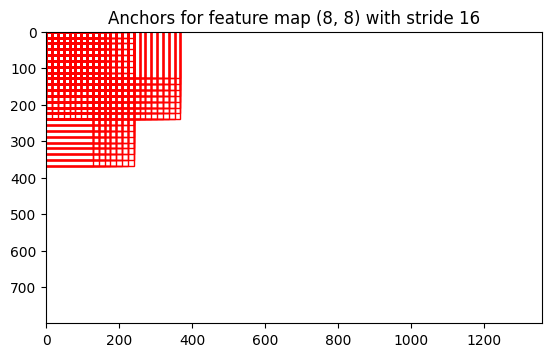

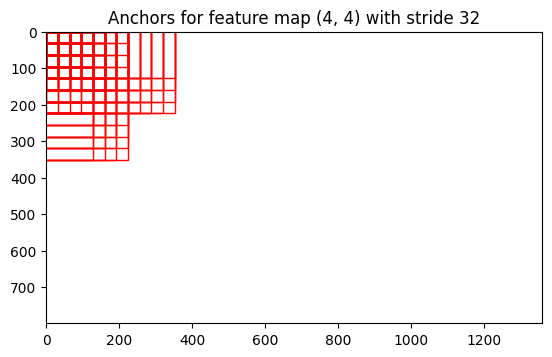

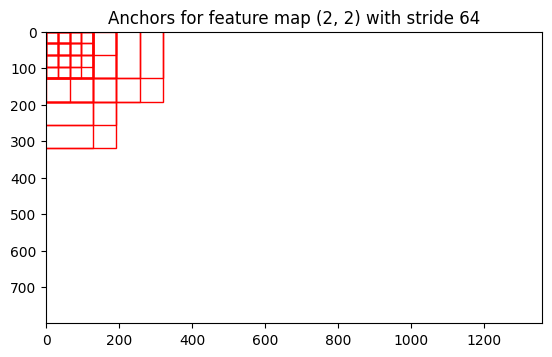

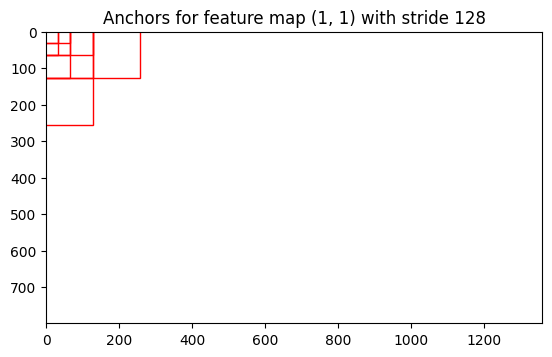

In [ ]:
# Γραφικη απεικονηση των Anchors
image = plt.imread("/content/TrainIJCNN2013/00/00000.ppm")
image = torch.ones((800, 1360, 3))  # Dummy εικόνα (μορφή HxWxC)
scales = [64, 128, 256]  # Κλίμακες των anchors
ratios = [(1, 1), (1, 2), (2, 1)]  # Αναλογίες διαστάσεων
feature_map_sizes = [(8, 8), (4, 4), (2, 2), (1, 1)]  # Διαστάσεις feature maps
strides = [16, 32, 64, 128]  # Stride για κάθε feature map

# Βρόχος για απεικόνιση anchors σε κάθε feature map
for idx, feature_map_size in enumerate(feature_map_sizes):
    stride = strides[idx]
    anchors = generate_anchors(scales, ratios, feature_map_size, stride)
    plot_anchors(image.numpy(), anchors, feature_map_size, stride)


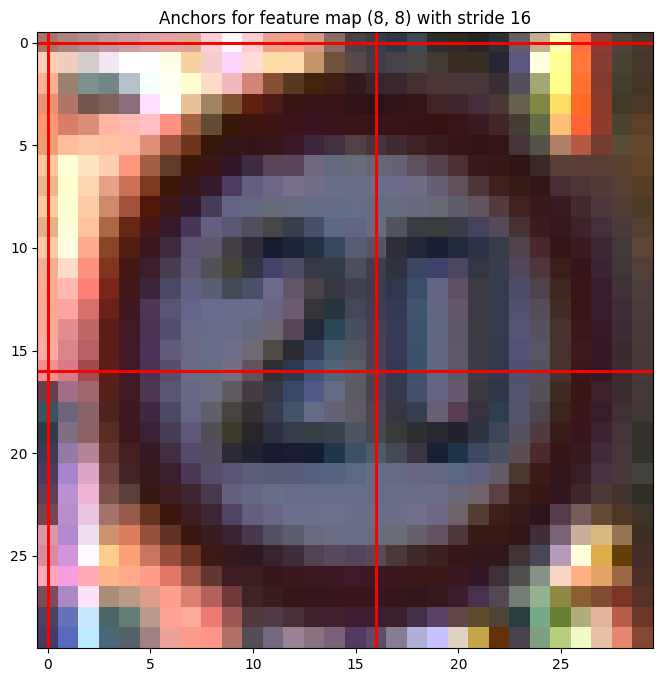

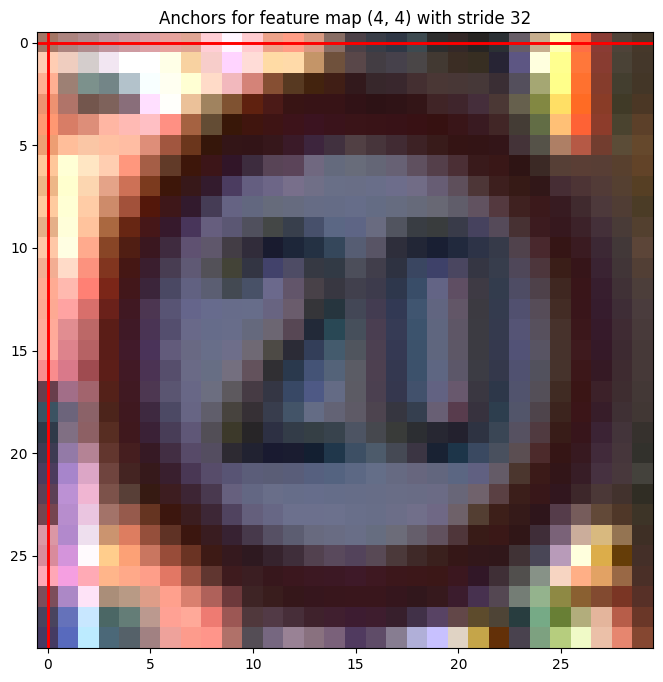

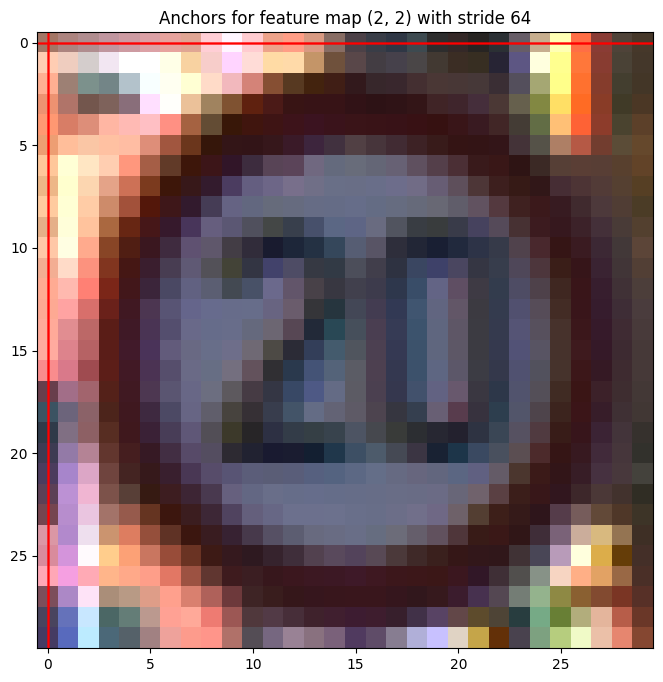

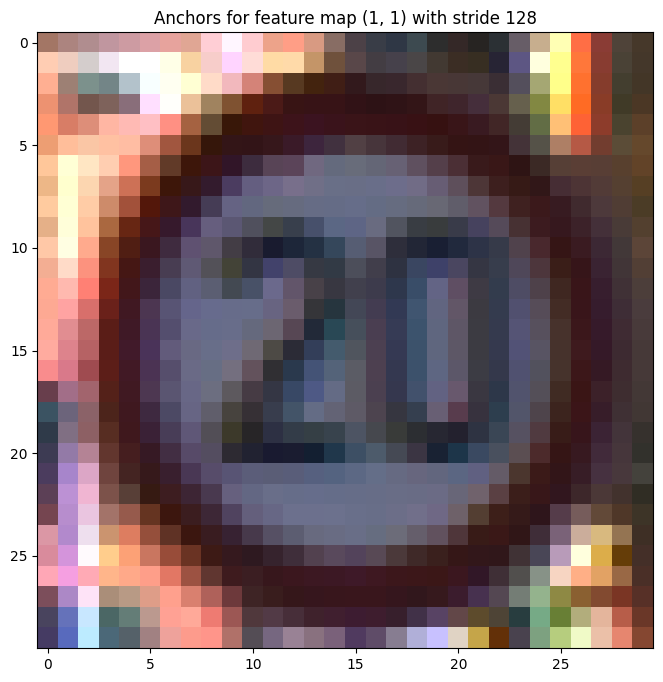

In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Δημιουργία anchor boxes για ένα συγκεκριμένο feature map
def generate_anchors(scales, ratios, feature_map_size, stride):
    anchors = []
    for i in range(feature_map_size[0]):
        for j in range(feature_map_size[1]):
            center_x = j * stride
            center_y = i * stride
            for scale in scales:
                for ratio in ratios:
                    w = scale * ratio[0]
                    h = scale * ratio[1]
                    anchors.append([center_x, center_y, w, h])
    return torch.tensor(anchors)

# Απεικόνιση anchors σε μία εικόνα
def plot_anchors(image, anchors, feature_map_size, stride):
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Μετατροπή συντεταγμένων anchor boxes σε κλίμακα εικόνας
    anchors = anchors.numpy()
    for anchor in anchors:
        center_x, center_y, w, h = anchor
        rect = patches.Rectangle((center_x - w / 2, center_y - h / 2), w, h,
                                 linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.title(f"Anchors for feature map {feature_map_size} with stride {stride}")
    plt.show()

# Φόρτωση της πραγματικής εικόνας
image_path = "/content/TrainIJCNN2013/00/00000.ppm"
image = plt.imread(image_path)

# Anchor configurations
scales = [64, 128, 256]  # Κλίμακες των anchors
ratios = [(1, 1), (1, 2), (2, 1)]  # Αναλογίες διαστάσεων
feature_map_sizes = [(8, 8), (4, 4), (2, 2), (1, 1)]  # Διαστάσεις feature maps
strides = [16, 32, 64, 128]  # Stride για κάθε feature map

# Βρόχος για απεικόνιση anchors σε κάθε feature map
for idx, feature_map_size in enumerate(feature_map_sizes):
    stride = strides[idx]
    anchors = generate_anchors(scales, ratios, feature_map_size, stride)
    plot_anchors(image, anchors, feature_map_size, stride)
